In [2]:
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [3]:
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
breast_cancer_wisconsin_diagnostic = fetch_ucirepo(id=17) 
  

# data (as pandas dataframes) 
X = breast_cancer_wisconsin_diagnostic.data.features 
y = breast_cancer_wisconsin_diagnostic.data.targets 
  
# metadata 
print(breast_cancer_wisconsin_diagnostic.metadata) 
  
# variable information 
print(breast_cancer_wisconsin_diagnostic.variables) 


{'uci_id': 17, 'name': 'Breast Cancer Wisconsin (Diagnostic)', 'repository_url': 'https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic', 'data_url': 'https://archive.ics.uci.edu/static/public/17/data.csv', 'abstract': 'Diagnostic Wisconsin Breast Cancer Database.', 'area': 'Life Science', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 569, 'num_features': 30, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['Diagnosis'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1993, 'last_updated': 'Mon Jul 17 2023', 'dataset_doi': '10.24432/C5DW2B', 'creators': ['William Wolberg', 'Olvi Mangasarian', 'Nick Street', 'W. Street'], 'intro_paper': {'title': 'Nuclear feature extraction for breast tumor diagnosis', 'authors': 'W. Street, W. Wolberg, O. Mangasarian', 'published_in': 'Electronic imaging', 'year': 1993, 'url': 'https://www.semanticscholar.org/paper/53f0fbb42

In [10]:
y.value_counts()

Diagnosis
1            357
0            212
dtype: int64

In [4]:
X.describe(include="all")

,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,radius3,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [5]:
X.columns.values

array(['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1',
       'compactness1', 'concavity1', 'concave_points1', 'symmetry1',
       'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2',
       'smoothness2', 'compactness2', 'concavity2', 'concave_points2',
       'symmetry2', 'fractal_dimension2', 'radius3', 'texture3',
       'perimeter3', 'area3', 'smoothness3', 'compactness3', 'concavity3',
       'concave_points3', 'symmetry3', 'fractal_dimension3'], dtype=object)

In [6]:
y

,Diagnosis
0,M
1,M
2,M
3,M
4,M
...,...
564,M
565,M
566,M
567,M


In [7]:
y.loc[y['Diagnosis']== 'M','Diagnosis']=0
y.loc[y['Diagnosis']== 'B','Diagnosis']=1


/var/folders/9k/k1q1zj057g91f5wsprbh0k_40000gn/T/ipykernel_49669/2114140871.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y.loc[y['Diagnosis']== 'M','Diagnosis']=0
/var/folders/9k/k1q1zj057g91f5wsprbh0k_40000gn/T/ipykernel_49669/2114140871.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y.loc[y['Diagnosis']== 'B','Diagnosis']=1


In [14]:
sns.pairplot(X)

<Axes: xlabel='radius1', ylabel='perimeter1'>

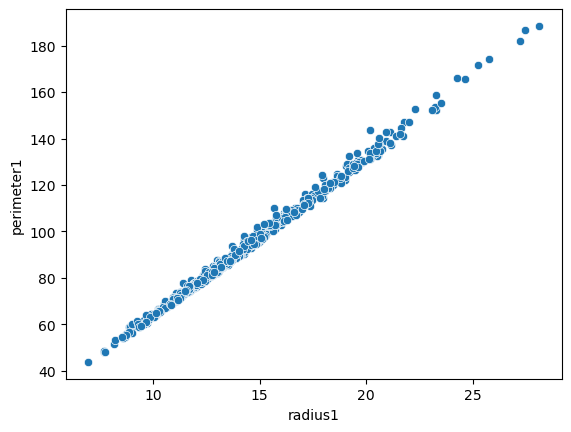

In [8]:
sns.scatterplot(x=X['radius1'],y= X['perimeter1'])

In [30]:
ols_formula='perimeter1~radius1'
OLS=ols(formula=ols_formula,data=X)
model=OLS.fit()
model2=model.predict()


In [31]:
model2

array([118.54601242, 136.29744517, 130.24269292,  73.34178252,
       134.37093309,  80.42859482, 120.3349165 ,  89.09789918,
        84.21281498,  80.49739882, 104.99162385, 103.34032778,
       126.66488477, 103.8219558 ,  89.23550719,  94.80863142,
        95.77188746, 105.74846788, 131.06834095,  87.92823113,
        84.763247  ,  60.15893557, 100.31295166, 140.35688134,
       109.32627604, 112.69767218,  95.08384744, 122.8118606 ,
       100.03773564, 115.6562443 , 122.94946861,  76.23155064,
       111.87202414, 127.35292479, 105.74846788, 109.94551206,
        92.81331534,  84.41922699,  97.90481155,  87.51540712,
        87.24019111,  70.10799438, 125.97684474,  86.13932706,
        85.38248303, 123.08707661,  51.15937199,  85.38248303,
        77.6764347 ,  87.58421112,  75.68111862,  88.61627116,
        76.91959067, 120.12850449,  98.66165559,  74.02982255,
       126.94010078,  95.97829947,  84.55683499,  54.06290091,
        64.74128216,  53.9252929 ,  92.81331534,  57.88

In [32]:
model_results=model.summary()
model_results

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             perimeter1   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                 1.318e+05
Date:                Thu, 26 Oct 2023   Prob (F-statistic):               0.00
Time:                        09:41:50   Log-Likelihood:                -1070.9
No. Observations:                 569   AIC:                             2146.
Df Residuals:                     567   BIC:                             2155.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -5.2324      0.276    -18.960      0.000      -5.774      -4.690
radius1        6.8804      0.019    362.988      0.000       6.843       6.918
==============================================================================
Omnibus:                      165.866   Durbin-Watson:                   1.787
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              601.949
Skew:                           1.318   Prob(JB):                    1.94e-131
Kurtosis:                       7.295   Cond. No.                         60.5
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [49]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test= train_test_split(X,y, test_size=0.3, stratify=y )

In [50]:
print(type(X_train))
print(type(X_test))
print(type(y_train))
print(type(y_test))

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


In [51]:
y_train

,Diagnosis
522,1
432,0
234,1
326,1
12,0
...,...
444,0
37,1
392,0
62,0


In [57]:
serie = y_train.loc[:, 'Diagnosis']


In [54]:
serie = y_train.iloc[:, 0]  # Esto seleccionará la primera columna del DataFrame


In [55]:
serie

522    1
432    0
234    1
326    1
12     0
      ..
444    0
37     1
392    0
62     0
296    1
Name: Diagnosis, Length: 398, dtype: object

In [9]:
from sklearn.neighbors import KNeighborsClassifier as knn

neigh= knn(n_neighbors=3)
neigh.fit(X=X_train,y=y_train)

NameError: name 'X_train' is not defined

array([[1],
       [1],
       [1],
       [1],
       [0],
       [0],
       [1],
       [1],
       [1],
       [0],
       [1],
       [1],
       [0],
       [1],
       [1],
       [0],
       [1],
       [0],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [0],
       [1],
       [0],
       [1],
       [0],
       [1],
       [0],
       [1],
       [1],
       [1],
       [1],
       [0],
       [1],
       [0],
       [0],
       [1],
       [1],
       [1],
       [1],
       [0],
       [1],
       [1],
       [0],
       [1],
       [1],
       [1],
       [1],
       [0],
       [1],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [0],
       [0],
       [1],
       [0],
       [0],
       [1],
       [1],
       [0],
       [1],
       [1],
       [1],
       [0],
       [1],
       [1],
       [0],
       [1],
       [1],
       [0],
       [1],
       [0],
       [0],
       [1],
       [0],
       [0],
    